# Predicting used cars prices - ML model

In this notebook we have build a Machine Learning model to predict and recommend the prices for used cars in the United States. Additionally thanks to Spark Streaming we can provide recommendations for new listings in real time.




**Authors:**
- Joao Ferreira - 20221912
- Rodrigo Maia - 20221934 
- Miguel Mendes - 20221904
- Marek Rewolinski - 20241452
- Michał Wójcik - 20241255


In [0]:
#importing all neccesary libraries
from pyspark.ml import Pipeline, Estimator, Model, Transformer
from pyspark.ml.param.shared import Param, Params, TypeConverters
from pyspark.ml.util import DefaultParamsReadable, DefaultParamsWritable
from pyspark.ml.clustering import KMeans, KMeansModel
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.feature import (
    VectorAssembler, StandardScaler, StringIndexer, Imputer
)
from pyspark.ml.regression import (
    RandomForestRegressor, GBTRegressor, LinearRegression, GeneralizedLinearRegression
)
from pyspark.ml.evaluation import RegressionEvaluator

from pyspark.sql import DataFrame
from pyspark.sql import functions as F
from pyspark.sql.functions import *
from pyspark.sql.types import (
    StructType, StructField, IntegerType, StringType, FloatType, 
    LongType, TimestampType, DoubleType, NumericType
)
from pyspark.sql.window import Window

from math import ceil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [0]:
# Define the schema
schema = StructType([
    StructField("id", LongType(), True),
    StructField("url", StringType(), True),
    StructField("region", StringType(), True),
    StructField("region_url", StringType(), True),
    StructField("price", IntegerType(), True),
    StructField("year", FloatType(), True),
    StructField("manufacturer", StringType(), True),
    StructField("model", StringType(), True),
    StructField("condition", StringType(), True),
    StructField("cylinders", StringType(), True),
    StructField("fuel", StringType(), True),
    StructField("odometer", FloatType(), True),
    StructField("title_status", StringType(), True),
    StructField("transmission", StringType(), True),
    StructField("VIN", StringType(), True),
    StructField("drive", StringType(), True),
    StructField("size", StringType(), True),
    StructField("type", StringType(), True),
    StructField("paint_color", StringType(), True),
    StructField("image_url", StringType(), True),
    StructField("county", FloatType(), True),
    StructField("state", StringType(), True),
    StructField("lat", FloatType(), True),
    StructField("long", FloatType(), True),
    StructField("posting_date", TimestampType(), True)
])

In [0]:
#load the data
data_raw = spark.read.csv("/FileStore/tables/vehicles_1.csv", schema = schema, header = True)

In [0]:
path = "/FileStore/"

In [0]:
#Partition data by posting month column

data_partitioned = data_raw.withColumn("posting_month", month(col("posting_date"))).repartition("posting_month")
data_partitioned.rdd.getNumPartitions()

Out[13]: 2

# **DATA UNDERSTANDING**

In [0]:
display(data_partitioned)

id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,image_url,county,state,lat,long,posting_date,posting_month
7222695916,https://prescott.craigslist.org/cto/d/prescott-2010-ford-ranger/7222695916.html,prescott,https://prescott.craigslist.org,6000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,az,null,null,null,null
7218891961,https://fayar.craigslist.org/ctd/d/bentonville-2017-hyundai-elantra-se/7218891961.html,fayetteville,https://fayar.craigslist.org,11900,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ar,null,null,null,null
7221797935,https://keys.craigslist.org/cto/d/summerland-key-2005-excursion/7221797935.html,florida keys,https://keys.craigslist.org,21000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,fl,null,null,null,null
7222270760,https://worcester.craigslist.org/cto/d/west-brookfield-2002-honda-odyssey-ex/7222270760.html,worcester / central MA,https://worcester.craigslist.org,1500,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ma,null,null,null,null
7210384030,https://greensboro.craigslist.org/cto/d/trinity-1965-chevrolet-truck/7210384030.html,greensboro,https://greensboro.craigslist.org,4900,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,nc,null,null,null,null
7222379453,https://hudsonvalley.craigslist.org/cto/d/westtown-2007-ford-150/7222379453.html,hudson valley,https://hudsonvalley.craigslist.org,1600,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ny,null,null,null,null
7221952215,https://hudsonvalley.craigslist.org/cto/d/westtown-silverado-2000/7221952215.html,hudson valley,https://hudsonvalley.craigslist.org,1000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ny,null,null,null,null
7220195662,https://hudsonvalley.craigslist.org/cto/d/poughquag-2015-acura-rdx-warranty/7220195662.html,hudson valley,https://hudsonvalley.craigslist.org,15995,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ny,null,null,null,null
7209064557,https://medford.craigslist.org/cto/d/grants-pass-two-2002-bmw-tii/7209064557.html,medford-ashland,https://medford.craigslist.org,5000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,or,null,null,null,null
7219485069,https://erie.craigslist.org/cto/d/erie-2012-suzuki-sx4/7219485069.html,erie,https://erie.craigslist.org,3000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,pa,null,null,null,null


In [0]:
# Check the data type
type(data_partitioned)

Out[15]: pyspark.sql.dataframe.DataFrame

In [0]:
#print schema
data_partitioned.printSchema()

root
 |-- id: long (nullable = true)
 |-- url: string (nullable = true)
 |-- region: string (nullable = true)
 |-- region_url: string (nullable = true)
 |-- price: integer (nullable = true)
 |-- year: float (nullable = true)
 |-- manufacturer: string (nullable = true)
 |-- model: string (nullable = true)
 |-- condition: string (nullable = true)
 |-- cylinders: string (nullable = true)
 |-- fuel: string (nullable = true)
 |-- odometer: float (nullable = true)
 |-- title_status: string (nullable = true)
 |-- transmission: string (nullable = true)
 |-- VIN: string (nullable = true)
 |-- drive: string (nullable = true)
 |-- size: string (nullable = true)
 |-- type: string (nullable = true)
 |-- paint_color: string (nullable = true)
 |-- image_url: string (nullable = true)
 |-- county: float (nullable = true)
 |-- state: string (nullable = true)
 |-- lat: float (nullable = true)
 |-- long: float (nullable = true)
 |-- posting_date: timestamp (nullable = true)
 |-- posting_month: integer (nu

In [0]:
print(data_partitioned.count(), len(data_partitioned.columns))

426880 26


In [0]:
#Count unique values per column
for col_name in data_partitioned.columns:
    unique_count = data_partitioned.select(col_name).distinct().count()
    print(f"Column '{col_name}' has {unique_count} unique values.")

Column 'id' has 426880 unique values.
Column 'url' has 426880 unique values.
Column 'region' has 404 unique values.
Column 'region_url' has 413 unique values.
Column 'price' has 15653 unique values.
Column 'year' has 115 unique values.
Column 'manufacturer' has 43 unique values.
Column 'model' has 29668 unique values.
Column 'condition' has 7 unique values.
Column 'cylinders' has 9 unique values.
Column 'fuel' has 6 unique values.
Column 'odometer' has 104871 unique values.
Column 'title_status' has 7 unique values.
Column 'transmission' has 4 unique values.
Column 'VIN' has 118265 unique values.
Column 'drive' has 4 unique values.
Column 'size' has 5 unique values.
Column 'type' has 14 unique values.
Column 'paint_color' has 13 unique values.
Column 'image_url' has 241900 unique values.
Column 'county' has 1 unique values.
Column 'state' has 51 unique values.
Column 'lat' has 52811 unique values.
Column 'long' has 53304 unique values.
Column 'posting_date' has 333356 unique values.
Co

# **DATA CLEANING**

We drop duplicated rows and keep only the latest entry specified by "posting_date", as the latest listings hold the most value for our model purpose

In [0]:

def drop_duplicates_keep_latest(df, partition_cols):
  """Drops duplicated rows based on specified columns, keeping the latest entry by 'posting_date'.

  Args:
    df: PySpark DataFrame.
    partition_cols: List of columns to consider for identifying duplicates.

  Returns:
    PySpark DataFrame with duplicates removed and the most recent entry kept.
  """
  # Order by specified columns from the latest first to the earliest at the end
  window_spec = Window.partitionBy(*partition_cols).orderBy(desc("posting_date"))
  # Assign a row number starting from 1 to the x. The latest listing gets a 1
  df_with_row_num = df.withColumn("row_num", row_number().over(window_spec))
  # Filter rows with row number equal to 1 (i.e., the latest entry)
  deduped_df = df_with_row_num.filter(col("row_num") == 1).drop("row_num")
  return deduped_df

partition_cols = ['manufacturer','price','model','year','cylinders','title_status','region','odometer','VIN']
data_no_dup = drop_duplicates_keep_latest(data_partitioned, partition_cols)

There are listings with 43 unique manufacturers, however 90% of listings are cars produced by top 20. We streamline our analysis only for these top 20

In [0]:
# Creates a cumulative sum column depending on the manufacturer frequency
manufacturers = data_no_dup.groupBy(col('manufacturer')).agg(count('manufacturer').alias('count')).orderBy(col('count').desc()) \
        .withColumn("cumsum", sum("count").over(Window.orderBy(col("count").desc())))

# A variables with the total sum of unique manufacturers
all_manu = manufacturers.agg(sum("count")).collect()[0][0]
# Calculates the percentage cumulative sum
manufacturers = manufacturers.withColumn("cumsum", manufacturers["cumsum"] / all_manu*100)

# Filters 10% least frequent manufacturers
top_manu = manufacturers.filter(col('cumsum')<=90) 
# Filters out all of the 10% least popular manufacturers from the original dataset
# We use broadcast join and load a top_manu df into a memory as it has only 20 rows
data_top_manu = data_no_dup.join(broadcast(top_manu), on="manufacturer", how="left_semi")

There are listings with almost 30k unique models, however 90% of listings are top around 3.5k models, so we streamline our analysis only for these top models

In [0]:
# Creates a cumulative sum column depending on the model frequency
models = data_top_manu.groupBy(col('manufacturer'),col('model')).agg(count('model').alias('count')).orderBy(col('count').desc()) \
        .withColumn("cumsum", sum("count").over(Window.orderBy(col("count").desc())))

# A variables with the total sum of unique models
all_models = models.agg(sum("count")).collect()[0][0]
# Calculates the percentage cumulative sum
models = models.withColumn("cumsum", models["cumsum"] / all_models*100)

# Filters 10% least frequent models
top_models = models.filter(col('cumsum')<=90)
# Filters out all of the 10% least popular models from the original dataset
data_top_models = data_top_manu.join(broadcast(top_models), on=["manufacturer","model"], how="inner")

1. Drops region_url, image_url, latitude, longitude,county, id, url, count, cumsum, size because they will not help with the analysis
2. Set manual bottom price at 500 to filter out vehicles that were erroneously priced too low 
3. Filters out rows with empty or null URLs. If the URL was missing everything else was missing too
4. Filters out vehicles with an odometer reading lower than 1000 miles, as these might be outliers or irrelevant for analysis (new cars)
5. Filters out vehicles older than the year 2021 to ensure the analysis focuses on relatively recent listings.
6. Removes rows where the 'model' is null to ensure that the model is available for each listing.
7. Impute the 'cylinders' column: Extracts the numeric value from the 'cylinders' column (if any), converts it to an integer and assigns None if it's not a valid number.
8. Drop rows where 'title_status' is missing: Removes rows where the 'title_status' column has null values.
9. Handle 'other' values in categorical columns: Sets 'other' values in 'cylinders', 'fuel', 'transmission', and 'type' to None to represent missing data.
10. Adjust 'fuel' column: Changes the 'fuel' type to 'hybrid' if the fuel type is 'electric' and 'cylinders' is not null.


In [0]:
data_cleaned_no_dup = data_top_models \
    .drop('size', 'id', 'url', 'count', 'cumsum', 
          'region_url', 'image_url', 'lat', 
          'long', 'county') \
    .filter((col("price") >= 500) & (col("price").isNotNull())) \
    .filter((col("url") != "") & (col("url").isNotNull())) \
    .filter(col("odometer") >= 1000) \
    .filter(col("year") < 2022) \
    .filter(col("model").isNotNull()) \
    .dropna(subset=["title_status"]) \
    .withColumn("cylinders", when(
        regexp_extract(col("cylinders"), "(\d+)", 1) != "", 
        regexp_extract(col("cylinders"), "(\d+)", 1).cast("int")
    ).otherwise(None)) \
    .withColumn("cylinders", when(col("cylinders") == "other", None).otherwise(col("cylinders"))) \
    .withColumn("fuel", when(col("fuel") == "other", None).otherwise(col("fuel"))) \
    .withColumn("transmission", when(col("transmission") == "other", None).otherwise(col("transmission"))) \
    .withColumn("type", when(col("type") == "other", None).otherwise(col("type"))) \
    .withColumn("fuel", when((col("fuel") == "electric") & (col("cylinders").isNotNull()), "hybrid").otherwise(col("fuel")))

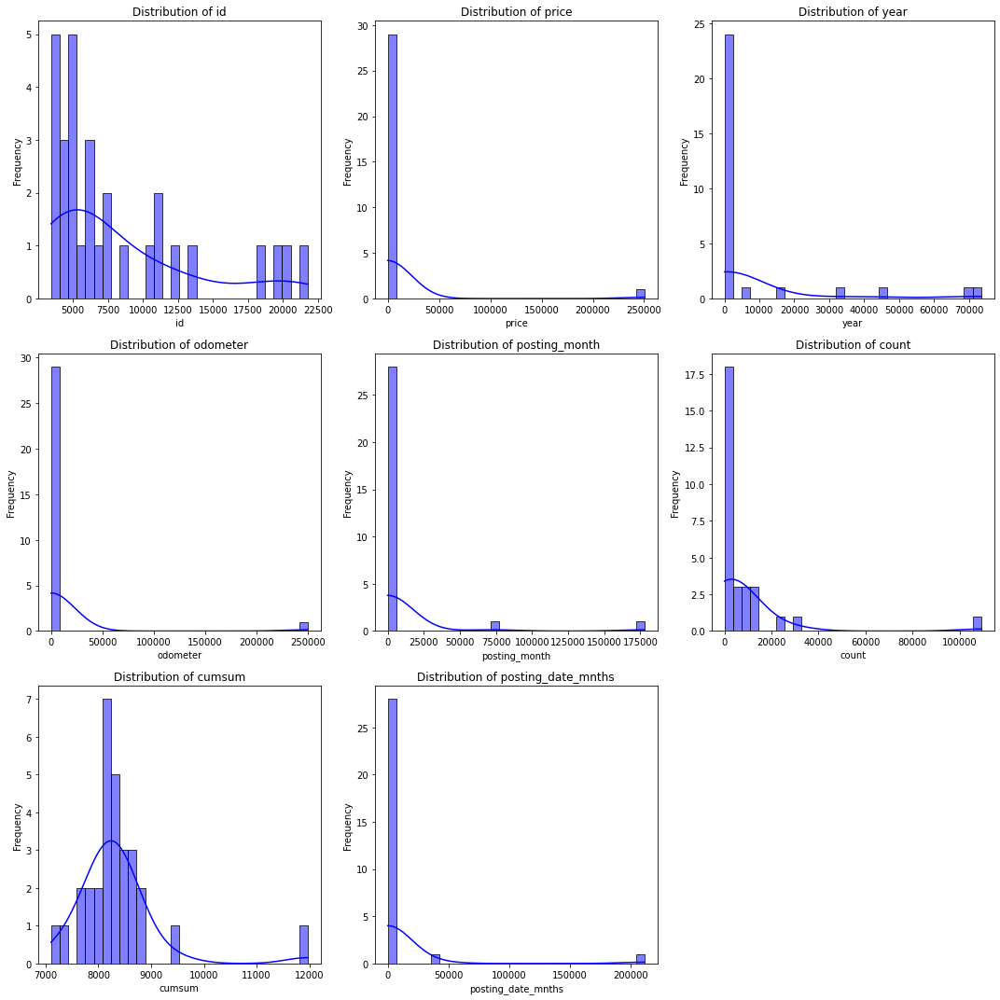

In [0]:
def plot_numerical_distributions(data_cleaned_no_dup, num_bins=30, cols_per_row=3):
    """
    Plot distributions of numerical variables in the dataframe using Spark RDD and efficient memory management.
    
    Parameters:
    data_cleaned_no_dup (DataFrame): The cleaned Spark DataFrame with no duplicates.
    num_bins (int): Number of bins to use for the histogram.
    cols_per_row (int): Number of plots per row in the final plot.
    """
   
    numerical_columns = [field.name for field in data_cleaned_no_dup.schema.fields if isinstance(field.dataType, NumericType)]
    
    #Extract numerical data as RDD to avoid using too much memory
    numerical_data_rdd = data_cleaned_no_dup.select(numerical_columns).rdd
    
    # Step 3: Create a function to process each column's data in parallel
    def process_column_data(row, columns):
        result = {}
        for i, col in enumerate(columns):
            values = [row[i] for row in row]
            result[col] = values
        return result
    
   # Using flatMap to avoid loading everything into memory at once
    data_rdd = numerical_data_rdd.flatMap(lambda row: [row]).collect()
    
    histograms = {}
    for col in numerical_columns:
        column_data = [row[col] for row in data_rdd if row[col] is not None]
        histograms[col], _ = np.histogram(column_data, bins=num_bins)
    
    num_columns = len(numerical_columns)
    rows = ceil(num_columns / cols_per_row)
    
    fig, axes = plt.subplots(rows, cols_per_row, figsize=(15, rows * 5))
    axes = axes.flatten()  
    
    for i, col in enumerate(numerical_columns):
        sns.histplot(histograms[col], kde=True, bins=num_bins, color='blue', ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')
    
    for i in range(num_columns, len(axes)):
        fig.delaxes(axes[i])
    
    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

plot_numerical_distributions(data_cleaned_no_dup, num_bins=30, cols_per_row=3)

# **Outlier Detection**

## Inter Quantile Range (IQR) outlier detection

In [0]:
# 2nd approach using IQR

# Define columns for which to detect outliers
columns = ["price", "odometer"]

# Dictionary to store bounds for each column
bounds = {}

# Calculate Q1, Q3, and IQR for each column and compute bounds
for column in columns:
    quantiles = data_cleaned_no_dup.approxQuantile(column, [0.25, 0.75], 0.01)
    q1 = quantiles[0]
    q3 = quantiles[1]
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    bounds[column] = (lower_bound, upper_bound)

# Filter outliers based on bounds for all specified columns
outliers_iqr = data_cleaned_no_dup.filter(
    (col("price") < bounds["price"][0]) | (col("price") > bounds["price"][1]) |
    (col("odometer") < bounds["odometer"][0]) | (col("odometer") > bounds["odometer"][1])
)

In [0]:
# Create new dataset after deleting outliers. Joins everything to the left except the records present in "outliers_iqr"

data_no_outliers_iqr = data_cleaned_no_dup.join(broadcast(outliers_iqr),on='id', how='leftanti').cache()
data_no_outliers_iqr.describe(['year', 'price', 'odometer']).display()

summary,year,price,odometer
count,244415,244415,244415
mean,2011.7159053249595,18662.356532946014,94081.22604586462
stddev,7.860881001625484,12537.204285020041,60903.1319466554
min,1900.0,500,1000.0
max,2021.0,57981,281487.0


## KMeans outlier detection

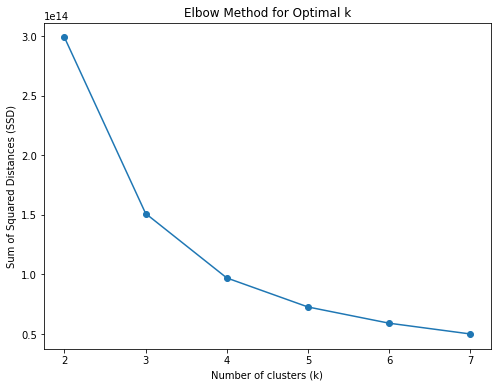

[298748663967591.44, 151098057642948.84, 97071118181814.5, 72737561572843.31, 59132686967583.93, 50098204937122.83]


In [0]:
def elbow_method_for_best_k(data, columns, k_range):
    """
    Finds the optimal number of clusters (k) for K-Means clustering using the elbow method.

    Args:
        data: The input PySpark DataFrame.
        columns: List of columns to include in clustering.
        k_range: Range of k values to test.

    Returns:
        None (plots the elbow method graph).
    """

    # Assemble features into a single vector
    vector_assembler = VectorAssembler(inputCols=columns, outputCol="features")
    data_vectorized = vector_assembler.transform(data)

    # Range of k values to test
    ssd = []  # Sum of squared distances
    # For debugging purposes [298748663967591.44, 151098057642948.84, 97071118181814.5, 72737561572843.31, 59132686967583.93, 50098204937122.83]

    for k in k_range:
        kmeans = KMeans(k=k, seed=1, featuresCol="features", predictionCol="cluster")
        model = kmeans.fit(data_vectorized)
        ssd.append(model.summary.trainingCost)

    # Plot SSD vs. k (Elbow Method)
    plt.figure(figsize=(8, 6))
    plt.plot(k_range, ssd, marker='o')
    plt.title('Elbow Method for Optimal k')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Distances (SSD)')
    plt.show()

    print(ssd)

# Example usage:
data_no_outliers_iqr.cache()
elbow_method_for_best_k(data_no_outliers_iqr, ["price", "odometer", "year"], range(2, 8))

4 clusters is the way based on elbow method

In [0]:
def process_clustering(data, path, columns, k=4, quantile_threshold=0.95):
    """
    Processes clustering, detects outliers, and fits or loads the KMeans model.

    Parameters:
        data: Spark DataFrame, input data to process.
        path: str, path to save/load the KMeans model.
        columns: list of str, column names to include in clustering.
        k: int, number of clusters for KMeans (default 5).
        quantile_threshold: float, quantile threshold for outlier detection (default 0.95).

    Returns:
        outliers: Spark DataFrame containing the outliers.
        data_with_clusters: Spark DataFrame with cluster predictions and distances.
    """

    # Assemble features into a single vector and scale
    vector_assembler = VectorAssembler(inputCols=columns, outputCol="features")
    scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)
    data_vectorized = Pipeline(stages=[vector_assembler, scaler]).fit(data).transform(data)

    # Load or fit the KMeans model
    def fit_or_load_model(path):
        try:
            model = KMeansModel.load(path + "kmeans_model_final")
        except:
            kmeans = KMeans(k=k, seed=1, featuresCol="scaledFeatures", predictionCol="cluster")
            model = kmeans.fit(data_vectorized)
            model.save(path + "kmeans_model_final")
        return model

    model = fit_or_load_model(path)

    # Add cluster predictions
    data_with_clusters = model.transform(data_vectorized)

    # Compute distance of each point to its assigned cluster center
    cluster_centers = model.clusterCenters()

    # UDF to calculate distance
    @udf(DoubleType())
    def compute_distance(features, cluster):
        center = np.array(cluster_centers[cluster])
        return float(np.linalg.norm(features - center))

    data_with_distances = data_with_clusters.withColumn(
        "distance_to_center", compute_distance(col("scaledFeatures"), col("cluster"))
    )

    # Define threshold for outliers
    threshold = data_with_distances.approxQuantile("distance_to_center", [quantile_threshold], 0.01)[0]

    # Filter outliers
    data_iqr_kmeans = data_with_distances.filter(col("distance_to_center") <= threshold)

    # Drop unnecessary columns
    data_iqr_kmeans = data_iqr_kmeans.drop("features", "distance_to_center", "scaledFeatures", "cluster")

    return data_iqr_kmeans

columns = ["price", "odometer", "year"]

data_iqr_kmeans = process_clustering(data_no_outliers_iqr, path, columns)
data_iqr_kmeans.describe().display()

summary,id,manufacturer,model,url,region,price,year,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state,posting_month,count,cumsum,posting_date_mnths
count,229834,229834,229834,229834,229834,229834,229834,148230,139193,229353,229834,227552,228953,144238,161265,65519,184054,169374,229834,229834,229834,229834,229834
mean,7.311804341440578E9,null,1716.0790359737728,null,null,18257.41612642168,2012.3372042430624,null,null,null,92036.76298545906,null,null,1.945520504554918E15,null,null,null,null,null,4.288704021163101,823.485402507897,45.41190767117135,43.15603870619665
stddev,4307329.692460415,null,1045.446750591109,null,null,11930.307255858788,6.41375393230477,null,null,null,58748.41634013071,null,null,1.1710207263460474E16,null,null,null,null,null,0.4531610120251171,1220.5914722273542,25.59663756614322,0.36289282350179985
min,7301583321,acura,"""4runner 1-arizona owner*0-rust*new bilstein toytec lift*new 33""""yokohama m/t*new black rhino wheels* 3rd seat*nav*black out pkg*0-accidents""",https://abilene.craigslist.org/ctd/d/abilene-2002-bmw-x5/7311833696.html,SF bay area,500,1962.0,excellent,10 cylinders,diesel,1000.0,clean,automatic,00000000118683018,4wd,compact,SUV,black,ak,4,8,2.08742177362133,43
max,7317098055,volkswagen,z4 sdrive35is roadster 2d,https://zanesville.craigslist.org/cto/d/zanesville-2013-chevy-silverado/7314710341.html,zanesville / cambridge,53179,2021.0,salvage,other,other,263000.0,salvage,other,ZFBHRFBB6L6P30378,rwd,sub-compact,wagon,yellow,wy,5,6531,89.80004730338732,44


## Summary: outlier detection
- approach 1 (Z-score) is the most basic and the least aggresive one of the three
- approach 2 (IQR) is the second most aggresive
- approach 3 (K-Means) is the most aggresive when is comes to outlier removal

For our analysis we decided to combine approaches 2 and 3 to create a robust dataset without any outliers. The IQR filters all rows with ambigous prices and the K-Means takes care of multidimensional outliers between price, odometer and year features


# Split 1% of the data to be later used for synthetic streaming

Step 1: Calculate the sampling fraction for each manufacturer `data_iqr_kmeans.select("manufacturer").distinct()` selects unique manufacturers from the dataset.
 `.withColumn("fraction", lit(0.99))` adds a new column called 'fraction' with a value of 0.99 for each manufacturer.
 `.rdd.collectAsMap()` collects the result as a dictionary, where the key is the manufacturer and the value is the fraction (0.99).

 Step 2: Sample the data by manufacturer, excluding outliers using the calculated fraction values in `frac` for each manufacturer. This helps in performing stratified sampling where each manufacturer’s data is sampled with 99% of its records.
 The `seed=42` ensures reproducibility of the random sampling.
 
 Step 3: Identify outliers by subtracting the sampled (no outliers) data from the original data
 `data_iqr_kmeans.subtract(data_no_outliers)` subtracts the rows that were sampled (no outliers) from the original dataset.
 The result is the rows that were not sampled, which are considered as outliers.


In [0]:
# Step 1: Calculate the sampling fraction for each manufacturer
frac = data_iqr_kmeans.select("manufacturer").distinct().withColumn("fraction", lit(0.99)).rdd.collectAsMap()

# Step 2: Sample the data by manufacturer, excluding outliers
data_no_outliers = data_iqr_kmeans.stat.sampleBy("manufacturer", frac, seed=42)

# Step 3: Identify outliers by subtracting the sampled (no outliers) data from the original data
data_streaming = data_iqr_kmeans.subtract(data_no_outliers)


# Feature Engineering 

1. Calculate 'age': Computes the vehicle's age by calculating the difference between the current date and the vehicle’s 'year' column,then dividing by 12 to get the age in years.
2. Create 'VIN' column: Adds a binary column ('VIN') indicating whether the 'VIN' is present or not (1 if present, 0 if not).
3. Create 'miles/year' column: Calculates the vehicle's average miles driven per year by dividing 'odometer' by 'age'.
4. Creates a new column 'posting_date_mnths' that calculates the number of months since the vehicle was posted. This is done by using the difference between the current date and the posting date in months, and rounding it down.

In [0]:
data_prepared_for_imputing = data_no_outliers \
    .withColumn("age", floor(months_between(current_date(), to_date(col("year").cast("int").cast("string"), "yyyy")) / lit(12))) \
    .withColumn("VIN", when(col("VIN").isNotNull(), 1).otherwise(0)) \
    .withColumn("miles/year", col("odometer") / col("age"))\
    .withColumn("posting_date_mnths", floor(months_between(current_date(), col("posting_date")))) \
    .drop("posting_month")

In [0]:
# columns that will have the nulls imputed
# the rest of null labels in the other columns will get its own category

cols_with_nulls = ["fuel", "transmission", "drive", "type", "paint_color"] 

# Stratified Train-Test Split

In [0]:
# Stratified split based on car's model

fractions = data_prepared_for_imputing.select("model").distinct().withColumn("fraction", lit(0.8)).rdd.collectAsMap()

train = data_prepared_for_imputing.stat.sampleBy("model", fractions, seed=42)
test = data_prepared_for_imputing.subtract(train)

# **Encoding**

This cell defines two custom Spark MLlib components for encoding categorical columns and handling null values:

**EncodeAndHandleNullsModel (Transformer):**

Applies pre-fitted StringIndexer models to encode categorical columns into numerical indices.
Treats the highest index value in specified columns as NULL.
Drops the original categorical columns after encoding.

**EncodeAndHandleNulls (Estimator):**

Fits StringIndexer models for specified categorical columns.
Returns a fitted EncodeAndHandleNullsModel for transforming data.

In [0]:
class EncodeAndHandleNullsModel(Transformer, DefaultParamsReadable, DefaultParamsWritable):
    def __init__(self, indexers, categorical_cols, cols_with_nulls, max_values):
        super(EncodeAndHandleNullsModel, self).__init__()
        self.indexers = indexers  # Dictionary of fitted StringIndexer models
        self.categorical_cols = categorical_cols
        self.cols_with_nulls = cols_with_nulls
        self.max_values = max_values  # Store the precomputed max values for handling nulls

    def _transform(self, data: DataFrame) -> DataFrame:
        # Apply the fitted indexers to the data
        for col_name, indexer in self.indexers.items():
            data = indexer.transform(data)

        # Handle null values using precomputed max values
        for col_name in self.cols_with_nulls:
            encoded_col = f"{col_name}_index"
            max_value = self.max_values[col_name]  # Use precomputed max value for each column
            data = data.withColumn(
                encoded_col,
                when(F.col(encoded_col) == max_value, None).otherwise(F.col(encoded_col))
            )

        # Drop original categorical columns
        data = data.drop(*self.categorical_cols)
        return data

class EncodeAndHandleNulls(Estimator, DefaultParamsReadable, DefaultParamsWritable):
    def __init__(self, categorical_cols, cols_with_nulls):
        super(EncodeAndHandleNulls, self).__init__()
        self.categorical_cols = categorical_cols
        self.cols_with_nulls = cols_with_nulls

    def _fit(self, data: DataFrame) -> EncodeAndHandleNullsModel:
        # Fit StringIndexers for each categorical column
        indexers = {
            col_name: StringIndexer(inputCol=col_name, outputCol=f"{col_name}_index", handleInvalid="keep").fit(data)
            for col_name in self.categorical_cols
        }

        # Apply the indexers to the data to generate the indexed columns
        for col_name, indexer in indexers.items():
            data = indexer.transform(data)

        # Precompute max values for columns with nulls based on indexed columns
        max_values = {}
        for col_name in self.cols_with_nulls:
            encoded_col = f"{col_name}_index"
            max_value = data.agg(F.max(encoded_col)).collect()[0][0]
            max_values[col_name] = max_value
        
        # Return a fitted Transformer with precomputed max values
        return EncodeAndHandleNullsModel(
            indexers=indexers,
            categorical_cols=self.categorical_cols,
            cols_with_nulls=self.cols_with_nulls,
            max_values=max_values
        )


# Imputation

This code defines two custom Spark MLlib components for imputing missing values using precomputed modes:

**CalculateAndImputeModesModel (Transformer):**

Uses a precomputed DataFrame of mode values to impute missing values in specified columns.
Matches rows by manufacturer_index and model_index, and replaces nulls with the corresponding mode.
Drops temporary mode columns after imputation.

**CalculateAndImputeModes (Estimator):**

Calculates the mode for specified columns grouped by manufacturer_index and model_index.
Prepares a modes DataFrame and returns a CalculateAndImputeModesModel for applying imputation.

In [0]:
# Define the custom transformer class
class CalculateAndImputeModesModel(Transformer, DefaultParamsReadable, DefaultParamsWritable):
    def __init__(self, modes_df, columns_with_nulls):
        # Initialize the model with the precomputed modes DataFrame and list of columns to impute
        super(CalculateAndImputeModesModel, self).__init__()
        self.modes_df = modes_df  # DataFrame containing the modes for imputation
        self.columns_with_nulls_encoded = columns_with_nulls  # List of columns that need imputation

    def _transform(self, dataset: DataFrame) -> DataFrame:
        # Step 1: Join the dataset with the precomputed modes
        # Join on manufacturer and model indices to match the mode values for imputation
        data_imputed = dataset.join(broadcast(self.modes_df), on=["manufacturer_index", "model_index"], how="left")

        # Step 2: Impute missing values in the columns that require imputation
        # Iterate through each column and replace null values with the corresponding mode
        for col_name in self.columns_with_nulls_encoded:
            mode_col_name = col_name + "_mode"  # Get the mode column name for the current column
            data_imputed = data_imputed.withColumn(
                col_name,
                when(isnull(col(col_name)), col(mode_col_name)).otherwise(col(col_name))  # Replace nulls with mode
            )

        # Step 3: Drop the mode columns after imputation if not needed
        # The mode columns are no longer required after imputation, so they are dropped
        mode_cols = [c + "_mode" for c in self.columns_with_nulls_encoded]
        data_imputed = data_imputed.drop(*mode_cols)

        # Return the imputed dataset
        return data_imputed

# Define the custom estimator class
class CalculateAndImputeModes(Estimator, DefaultParamsReadable, DefaultParamsWritable):
    def __init__(self, columns_with_nulls):
        # Initialize the estimator with the list of columns that require imputation
        super(CalculateAndImputeModes, self).__init__()
        self.columns_with_nulls_encoded = columns_with_nulls  # List of columns with missing values to be imputed

    def _fit(self, dataset: DataFrame) -> CalculateAndImputeModesModel:
        # Step 1: Remove rows with null values in the columns of interest to calculate valid modes
        # We need a clean dataset without nulls for computing the modes
        train_data_non_null = dataset
        for col_name in self.columns_with_nulls_encoded:
            train_data_non_null = train_data_non_null.dropna(subset=[col_name])

        # Step 2: Calculate modes for each specified column
        # For each column with missing values, calculate the most frequent value (mode) grouped by manufacturer and model
        modes_df = None
        for col_name in self.columns_with_nulls_encoded:
            # Group by manufacturer and model index, and count the occurrences of each value in the column
            grouped_counts = (
                train_data_non_null.groupBy("manufacturer_index", "model_index", col_name)
                .agg(count("*").alias("count"))  # Count the occurrences of each unique value in the column
            )

            # Create a window specification to rank values by frequency (most frequent first)
            window_spec = Window.partitionBy("manufacturer_index", "model_index") \
                                .orderBy(col("count").desc(), col(col_name))  # Order by the frequency of values

            mode_col_name = col_name + "_mode"  # Define the name for the mode column
            column_mode = (
                grouped_counts.withColumn("rank", row_number().over(window_spec))  # Add a rank column based on frequency
                .filter(F.col("rank") == 1)  # Keep only the most frequent value (rank 1)
                .select("manufacturer_index", "model_index", col_name)  # Select the necessary columns
                .withColumnRenamed(col_name, mode_col_name)  # Rename the column to reflect it's the mode
            )

            # Step 3: Combine modes for all columns into one DataFrame
            # If it's the first mode column, initialize the modes DataFrame; otherwise, join with the existing DataFrame
            if modes_df is None:
                modes_df = column_mode
            else:
                modes_df = modes_df.join(column_mode, on=["manufacturer_index", "model_index"], how="outer")

        # Step 4: Return the fitted model with the precomputed modes DataFrame
        return CalculateAndImputeModesModel(modes_df, self.columns_with_nulls_encoded)


In [0]:
def display_missing_values(df):
    total_count = df.count()
    # Aggregate null counts for all columns at once
    null_counts = df.agg(*[
        sum(when(isnull(c), 1).otherwise(0)).alias(c) 
        for c in df.columns
    ])

    # Convert counts to percentages
    percentage_df = null_counts.select([
        round((col(c) / total_count) * 100, 2).alias(c) 
        for c in null_counts.columns
    ])

    percentage_df.display()

display_missing_values(test)


manufacturer,price,year,odometer,VIN,age,miles/year,model,region,condition,fuel,title_status
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.9,7.91,0.0


# **MODELLING**


We experimented with multiple regression models to predict the target variable, including:

Random Forest Regressor (RF)
Gradient Boosted Trees Regressor (GBT)
Linear Regression (LR)
Generalized Linear Regression (GLR)

Among the tested models, Gradient Boosted Trees Regressor (GBT) outperformed the others and was identified as the best approach.

In [0]:
rf = RandomForestRegressor(featuresCol="features", labelCol="price", seed=42, maxBins=5000)
#rf_model = rf.fit(X_train)

gbt = GBTRegressor(featuresCol="features", labelCol="price", seed=42, maxBins=5000)
#gbt_model = gbt.fit(X_train)

lr = LinearRegression(featuresCol="features", labelCol="price_scaled", maxIter=10, regParam=0.3, elasticNetParam=0.8)
#lr_model = lr.fit(X_train)

glr = GeneralizedLinearRegression(featuresCol="features", labelCol="price_scaled", family="gaussian", link="identity", maxIter=10, regParam=0.3)
#glr_model = glr.fit(X_train)

# Regressions produce RMSE of 22k or more so they are not the preferred approach. The best is Gradient Boosting Regressor

# Feature Selection

## Recursive Feature Elimination (RFE)

In [0]:
def rfe(X_train, X_test, model, feature_names, num_features=None, evaluator=None):
    """
    Performs Recursive Feature Elimination (RFE) for GBTRegressor model.

    Parameters:
    - X_train: DataFrame, features for training.
    - X_test: DataFrame, features for testing.
    - model: GBTRegressor or RForest model to train.
    - feature_names: List of feature names used in the features column.
    - num_features: int, Number of features to keep (optional, if None all features will be kept).
    - evaluator: RegressionEvaluator, evaluator to calculate RMSE or any other metric for feature selection.

    Returns:
    - List of selected features.
    """
    # Step 1: Train the model with all features
    data_train = X_train
    data_test = X_test

    assembler = VectorAssembler(inputCols=feature_names, outputCol="features")
    data_train_assembled = assembler.transform(data_train)
    data_test_assembled = assembler.transform(data_test)

    model = model
    model_trained = model.fit(data_train_assembled)

    # Step 2: Get feature importance from the model
    feature_importance = model_trained.featureImportances.toArray()
    
    # Create a list of features with their corresponding importance values
    feature_importance_list = list(zip(feature_names, feature_importance))
    
    # Sort by importance (from high to low)
    feature_importance_list = sorted(feature_importance_list, key=lambda x: x[1], reverse=True)

    # Step 3: Initialize selected features with all features
    selected_features = feature_names.copy()
    best_features = selected_features
    best_rmse = 1e6

    if num_features is None:
        # If no number of features specified, just return all features and their importance
        return feature_importance_list
    else:
        # Step 4: Iteratively remove the least important feature
        for i in range(len(feature_importance_list) - num_features):
            # Remove the least important feature
            least_important_feature = feature_importance_list[-1][0]
            selected_features.remove(least_important_feature)
            
            # Update the assembler with the selected features
            data_train = data_train.drop("features")
            data_test = data_test.drop("features")

            assembler = VectorAssembler(inputCols=selected_features, outputCol="features")
            data_train_assembled = assembler.transform(data_train)
            data_test_assembled = assembler.transform(data_test)
            
            # Retrain the model with the selected features
            model_trained = model.fit(data_train_assembled)
            
            # Evaluate model performance (RMSE)
            evaluator = evaluator if evaluator else RegressionEvaluator(labelCol="price", predictionCol="prediction", metricName="rmse")
            predictions = model_trained.transform(data_test_assembled)
            rmse = evaluator.evaluate(predictions)
            
            print(f"Number of features: {len(selected_features)}, RMSE: {rmse}")
            
            # save the best features
            if rmse <= best_rmse:
                best_features = selected_features.copy() # overwrite best_features
                best_rmse = rmse # overwrite best_rmse

            # Update the feature_importance_list with the current features' importance
            feature_importance = model_trained.featureImportances.toArray()
            feature_importance_list = list(zip(selected_features, feature_importance))
            feature_importance_list = sorted(feature_importance_list, key=lambda x: x[1], reverse=True)
            
        # Return the selected features
        return best_features, best_rmse

feature_names = ['manufacturer_index','model_index','year','odometer','VIN','age','miles/year','region_index','state_index','condition_index','cylinders_index','fuel_index','title_status_index','transmission_index','drive_index','type_index','paint_color_index','posting_month_index']

#evaluator = RegressionEvaluator(labelCol="price", predictionCol="prediction", metricName="rmse")
#model = GBTRegressor(featuresCol="features", labelCol="price", maxBins=5000, seed=42)

# Call the RFE function
#best_features, best_rmse = rfe(train, test, model, feature_names=feature_names, num_features=3, evaluator=evaluator)
#print("Selected features:", best_features, best_rmse)

selected_features = ['model_index', 'year', 'odometer', 'VIN', 'age', 'miles/year', 'region_index', 'condition_index', 'fuel_index', 'title_status_index'] 


## RFE results for GBTClassifier

- **Number of features: 17**, RMSE: 3953.0943725617844
- **Number of features: 16**, RMSE: 3953.0943725617844
- **Number of features: 15**, RMSE: 3953.0943725617844
- **Number of features: 14**, RMSE: 3953.0943725617844
- **Number of features: 13**, RMSE: 3953.0943725617844
- **Number of features: 12**, RMSE: 3953.0943725617844
- **Number of features: 11**, RMSE: 3953.4159243684835
- **Number of features: 10**, RMSE: 3943.36088109062
- **Number of features: 9**, RMSE: 3953.7120263860998
- **Number of features: 8**, RMSE: 3963.7965619564957
- **Number of features: 7**, RMSE: 4039.275290338538
- **Number of features: 6**, RMSE: 4026.0327010662295
- **Number of features: 5**, RMSE: 4043.263127813629
- **Number of features: 4**, RMSE: 4121.055829391045
- **Number of features: 3**, RMSE: 4121.055829391045

### Selected features:
- `['model_index', 'year', 'odometer', 'VIN', 'age', 'miles/year', 'region_index', 'condition_index', 'fuel_index', 'title_status_index']`

**RMSE**: 3943.36088109062


# Final Pipeline

In [0]:
path = "/FileStore/"

train.write.mode("overwrite").parquet(path + "train_no_outliers")
test.write.mode("overwrite").parquet(path + "test_no_outliers")

train = spark.read.parquet(path + "train_no_outliers")
test = spark.read.parquet(path + "test_no_outliers")

In [0]:
train.count()

Out[45]: 180310

In [0]:
display(train)

manufacturer,model,region,price,year,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,type,paint_color,state,posting_month,age,miles/year
acura,tl,hartford,3500,2003.0,null,null,gas,164000.0,clean,automatic,0,null,null,null,ct,4,21,7809.523809523809
acura,tl,monterey bay,3800,2003.0,fair,6,gas,245000.0,clean,automatic,0,null,null,white,ca,4,21,11666.666666666666
acura,mdx,missoula,4000,2004.0,excellent,6,gas,201000.0,clean,automatic,0,4wd,SUV,black,mt,4,20,10050.0
acura,tsx sedan 4d,tulsa,15590,2012.0,good,null,gas,88409.0,clean,automatic,1,fwd,sedan,white,ok,4,12,7367.416666666667
acura,rdx sport utility 4d,visalia-tulare,16590,2014.0,good,6,gas,86919.0,clean,automatic,1,fwd,SUV,black,ca,4,10,8691.9
acura,ilx sedan 4d,el paso,16990,2015.0,good,null,null,47974.0,clean,null,1,fwd,sedan,white,tx,4,9,5330.444444444444
acura,tlx,ocala,16998,2015.0,null,null,gas,102196.0,clean,automatic,1,fwd,sedan,white,fl,4,9,11355.111111111111
acura,tl sh-awd sedan 4d,charlotte,17590,2012.0,good,null,null,67899.0,clean,null,1,null,sedan,white,nc,4,12,5658.25
acura,mdx,portland,19995,2013.0,good,6,gas,98097.0,clean,automatic,1,null,SUV,blue,or,5,11,8917.90909090909
acura,mdx sport utility 4d,san antonio,21990,2013.0,good,6,gas,40778.0,clean,null,1,null,null,null,tx,5,11,3707.090909090909


Databricks visualization. Run in Databricks to view.

In [0]:
# Features selected by the RFE as the best performing
selected_features = ['year', 'odometer', 'VIN', 'age', 'miles/year','model_index', 'region_index', 'condition_index', 'fuel_index', 'title_status_index'] 

# A set of the features selected by RFE + the necessary columns for the pipeline to work
the_most_needed_features = ['manufacturer', 'price', 'year', 'odometer', 'VIN', 'age', 'miles/year','model', 'region', 'condition', 'fuel', 'title_status']

# we delete the unneeded columns from the features to speed up training
train = train.select(the_most_needed_features) 
test = test.select(the_most_needed_features)

# Based on selected features we choose adequate columns for the Pipeline
categorical_cols = ["manufacturer", 'model', 'region', 'condition', 'fuel', 'title_status']

cols_with_nulls = ["fuel"]

columns_with_nulls_encoded = [col + "_index" for col in cols_with_nulls]

In [0]:
# Step 0: Encoding
encode_and_handle_nulls = EncodeAndHandleNulls(
    categorical_cols=categorical_cols, 
    cols_with_nulls=cols_with_nulls
)

# Step 1: Impute based on modes dataframe
calculate_and_impute = CalculateAndImputeModes(
    columns_with_nulls_encoded
)

# Step 2: Impute globally features that still have NULL values
mode_imputer = Imputer(
    strategy="mode", 
    inputCols=columns_with_nulls_encoded, 
    outputCols=columns_with_nulls_encoded
)

# Step 3: Assemble selected features
assembler = VectorAssembler(
    inputCols=selected_features, 
    outputCol="features"
)

# Step 4: Initialize the Gradient Boosted Trees (GBT) Regressor model
gbt_model = GBTRegressor(  # specify all hyperparameters from tuning
    featuresCol="features", 
    labelCol="price", 
    seed=42, 
    maxBins=5000
)

# Build the pipeline with all stages
final_pipeline = Pipeline(stages=[
    encode_and_handle_nulls, 
    calculate_and_impute, 
    mode_imputer,
    assembler, 
    gbt_model
])

# Fit the pipeline and save it to directory
final_pipeline_model = final_pipeline.fit(train)

predictions = final_pipeline_model.transform(test)

In [0]:
# Extract the GBT model from the pipeline
gbt_model = final_pipeline_model.stages[-1]  # GBTRegressor is the last stage

# Get feature importances from the GBTRegressor model
feature_importances = gbt_model.featureImportances

# Map the importances to the feature names
feature_list = [feature_importances[idx] for idx in range(len(feature_importances))]

# Get the list of feature names from the VectorAssembler inputCols
feature_names = selected_features

# Create a Pandas DataFrame for visualization
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_list
})

# Sort the features by their importance in descending order
importance_df.sort_values(by='Importance', ascending=False).display()


Feature,Importance
model_index,0.6353883052107182
year,0.10889433116260291
odometer,0.08527779888029055
age,0.0696230126402215
region_index,0.05447902952894565
title_status_index,0.013775310823061424
miles/year,0.011693586958062746
fuel_index,0.010103383433764981
condition_index,0.006456275905000332
VIN,0.004308965457331818


Databricks visualization. Run in Databricks to view.

In [0]:
# Initialize RegressionEvaluator for RMSE
evaluator_rmse = RegressionEvaluator(
    labelCol="price",
    predictionCol="prediction",
    metricName="rmse"
)

# Initialize RegressionEvaluator for MAE
evaluator_mae = RegressionEvaluator(
    labelCol="price",
    predictionCol="prediction",
    metricName="mae"
)

# Compute RMSE
rmse = evaluator_rmse.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE) on test data = {rmse}")

# Compute MAE
mae = evaluator_mae.evaluate(predictions)
print(f"Mean Absolute Error (MAE) on test data = {mae}")


Root Mean Squared Error (RMSE) on test data = 3938.036632964003
Mean Absolute Error (MAE) on test data = 2352.245389506523


# Hyperparameter Tuning
due to heavy computational load it was not possible to run this cell with free version of the cluster. More compute power is advised for tuning this model

In [0]:
# Create a parameter grid for GBTRegressor
paramGrid = (ParamGridBuilder()
             .addGrid(gbt_model.maxIter, [100, 150])
             #.addGrid(gbt_model.stepSize, [0.1, 0.05])
             .build())

# Define the evaluator
evaluator = RegressionEvaluator(
    labelCol="price",
    predictionCol="prediction",
    metricName="rmse" 
)

# Set up CrossValidator
crossval = CrossValidator(
    estimator=final_pipeline,
    estimatorParamMaps=paramGrid,
    evaluator=evaluator,
    numFolds=2,     
    parallelism=2,   # Adjust based on the nuber of spark cores: Here 2
    seed=42
)

# Fit the CrossValidator to the training data
cvModel = crossval.fit(train)

# Make predictions on the test set using the best model
predictions = cvModel.transform(test)

# Evaluate the best model's performance
rmse = evaluator.evaluate(predictions)
print(f"\nRoot Mean Squared Error (RMSE) on test data: {rmse}\n")
best_model = cvModel.bestModel
print(f"\nBest parameters are: {best_model.extractParamMap()}")

# **Streaming**

In this part we utilize Spark Streaming to provide real time predicitions for unseen by model listings. We load 2300 listings distributed evenly among 100 files.

In [0]:
# create a folder for storing streaming data
dbutils.fs.mkdirs("dbfs:/FileStore/Streaming_final")

Out[84]: True

In [0]:
#Define directory path, schema and load streaming dataframes. We have 100 different files with about 23 rows each. For each stream only 1 file will be considered and 10 rows will be loaded per second.

dir_path_files = "dbfs:/FileStore/Streaming_final"
checkpoints ="dbfs:/FileStore/checkpoints_stream/"

# Define the schema
schema = StructType([
    StructField("id", LongType(), True),
    StructField("manufacturer", StringType(), True),
    StructField("model", StringType(), True),
    StructField("url", StringType(), True),
    StructField("region", StringType(), True),
    StructField("price", FloatType(), True),
    StructField("year", FloatType(), True),
    StructField("condition", StringType(), True),
    StructField("cylinders", StringType(), True),
    StructField("fuel", StringType(), True),
    StructField("odometer", FloatType(), True),
    StructField("title_status", StringType(), True),
    StructField("transmission", StringType(), True),
    StructField("VIN", StringType(), True),
    StructField("drive", StringType(), True),
    StructField("size", StringType(), True),
    StructField("type", StringType(), True),
    StructField("paint_color", StringType(), True),
    StructField("state", StringType(), True),
    StructField("posting_date", TimestampType(), True),
    StructField("file_id", FloatType(), True),
])
streaming_df = (
    spark
    .readStream 
    .schema(schema)
    .option("maxFilesPerTrigger", 1)
    .option("rowsPerSeconds",10)
    .option("header", "true")
    .option("checkpointLocation", checkpoints)
    .csv(dir_path_files + "/*.csv") )

In [0]:
# prepare the date - drop features not used by models and transform others + create new. In a very similar fashion to what has been done before

streaming_prep = streaming_df \
                                      .drop('size',"file_id") \
                                      .withColumn("cylinders", when(regexp_extract(col("cylinders"), "(\d+)", 1) != "",
                                                                  regexp_extract(col("cylinders"), "(\d+)", 1).cast("int"))   
                                                            .otherwise(None))\
                                      .dropna(subset=["title_status"]) \
                                      \
                                      .withColumn("cylinders", when(col("cylinders") == "other", None).otherwise(col("cylinders"))) \
                                      .withColumn("fuel", when(col("fuel") == "other", None).otherwise(col("fuel"))) \
                                      .withColumn("transmission", when(col("transmission") == "other", None).otherwise(col("transmission"))) \
                                      .withColumn("type", when(col("type") == "other", None).otherwise(col("type"))) \
                                      \
                                      .withColumn("age", floor(months_between(current_date(), to_date(col("year").cast("int").cast("string"), "yyyy")) / lit(12))) \
                                      .withColumn("VIN", when(col("VIN").isNotNull(), 1).otherwise(0)) \
                                      .withColumn("miles/year", col("odometer") / col("age")) \
                                      .withColumn("fuel", when((col("fuel") == "electric") & (col("cylinders").isNotNull()), "hybrid").otherwise(col("fuel")))

In [0]:
display(streaming_prep)

id,manufacturer,model,url,region,price,year,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,type,paint_color,state,posting_date,age,miles/year
7316249288,jeep,wrangler rubicon,https://denver.craigslist.org/cto/d/golden-2004-jeep-wrangler-tj-auto-lifted/7316249288.html,denver,11995.0,2004.0,good,6,gas,149000.0,clean,automatic,0,4wd,null,black,co,2021-05-03T16:18:38.000+0000,20,7450.0
7315721636,ford,explorer,https://houston.craigslist.org/ctd/d/houston-2015-ford-explorer-sport/7315721636.html,houston,18945.0,2015.0,excellent,null,gas,83202.0,clean,automatic,1,null,null,white,tx,2021-05-02T13:58:41.000+0000,9,9244.666666666666
7313163294,hyundai,sonata limited,https://easttexas.craigslist.org/ctd/d/longview-2014-hyundai-sonata-sharp-car/7313163294.html,tyler / east TX,15999.0,2014.0,excellent,4,gas,57000.0,clean,automatic,0,fwd,sedan,white,tx,2021-04-27T02:07:25.000+0000,10,5700.0
7311986632,honda,ridgeline rtl pickup 4d 5,https://nashville.craigslist.org/ctd/d/nashville-2020-honda-ridgeline-rtl/7311986632.html,nashville,39990.0,2020.0,good,6,gas,1371.0,clean,null,1,null,pickup,white,tn,2021-04-24T18:31:02.000+0000,4,342.75
7316471859,ford,fusion,https://milwaukee.craigslist.org/ctd/d/milwaukee-2010-ford-fusion/7316471859.html,milwaukee,5999.0,2010.0,null,null,gas,150921.0,clean,automatic,0,null,null,null,wi,2021-05-03T22:26:25.000+0000,14,10780.07142857143
7308207170,ford,mustang,https://huntsville.craigslist.org/ctd/d/huntsville-2010-ford-mustang-gt/7308207170.html,huntsville / decatur,15493.0,2010.0,null,8,gas,136145.0,clean,null,1,rwd,convertible,white,al,2021-04-17T14:01:39.000+0000,14,9724.642857142857
7304005746,ram,promaster cargo van,https://madison.craigslist.org/ctd/d/madison-2017-ram-promaster-city-cargo/7304005746.html,madison,12995.0,2017.0,null,null,gas,101510.0,clean,automatic,1,null,null,null,wi,2021-04-09T03:07:00.000+0000,7,14501.42857142857
7313846086,jeep,wrangler,https://desmoines.craigslist.org/ctd/d/gretna-2009-jeep-wrangler/7313846086.html,des moines,17988.0,2009.0,null,null,gas,146950.0,clean,manual,1,null,null,null,ia,2021-04-28T15:41:27.000+0000,15,9796.666666666666
7315093110,acura,tsx 2.4,https://albany.craigslist.org/cto/d/gansevoort-acura-tsx-2006/7315093110.html,albany,4500.0,2006.0,excellent,4,gas,200000.0,clean,automatic,0,fwd,sedan,grey,ny,2021-04-30T23:29:26.000+0000,18,11111.111111111111
7312792478,jeep,grand cherokee limited x,https://visalia.craigslist.org/ctd/d/visalia-2020-jeep-grand-cherokee/7312792478.html,visalia-tulare,36990.0,2020.0,good,null,null,12324.0,clean,null,1,null,SUV,black,ca,2021-04-26T14:50:51.000+0000,4,3081.0


Run the model on new streaming data and save it to memory for fast results

In [0]:
predictions_stream = final_pipeline_model.transform(streaming_prep)

query = (
    predictions_stream.writeStream
    .outputMode("append")
    .format("memory")
    .option("path", "dbfs:/FileStore/Streaming_pred")
    .queryName("predictions")
    .start()
)

query.awaitTermination(2)

Out[26]: False

In [0]:
query.stop()

Display the lastest predictions as statis data from memory sink

In [0]:
spark.sql(""" SELECT id, round(prediction,0) AS Recommended_price FROM predictions""").display()

id,Recommended_price
7316249288,11547.0
7315721636,21010.0
7313163294,12784.0
7311986632,37291.0
7316471859,4275.0
7308207170,10808.0
7304005746,20847.0
7313846086,17497.0
7315093110,5420.0
7312792478,37992.0


Save the models predictions to parquet files

In [0]:
predictions_stream_save = final_pipeline_model.transform(streaming_prep)

query_save = (
    predictions_stream_save.writeStream
    .outputMode("append")
    .format("parquet")
    .option("checkpointLocation", "dbfs:/FileStore/checkpoints_stream/")
    .option("path", "dbfs:/FileStore/Streaming_pred")
    .start()
)

query_save.awaitTermination(2)

Out[172]: False

In [0]:
predictions_read = spark.read.parquet("dbfs:/FileStore/Streaming_pred/*")

display(predictions_read)

manufacturer_index,model_index,id,url,price,year,cylinders,odometer,transmission,VIN,drive,type,paint_color,state,posting_date,age,miles/year,region_index,condition_index,fuel_index,title_status_index,features,prediction
3.0,975.0,7316284637,https://sfbay.craigslist.org/sby/ctd/d/palo-alto-2020-honda-pilot-ex-sport/7316284637.html,34990.0,2020.0,6,17471.0,null,1,null,null,null,ca,2021-05-03T17:11:18.000+0000,4,4367.75,41.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2020.0, 17471.0, 1.0, 4.0, 4367.75, 975.0, 41.0, 0.0, 0.0, 0.0))",32190.46845928074
0.0,0.0,7311635611,https://imperial.craigslist.org/cto/d/calexico-2019-ford-f150/7311635611.html,27800.0,2019.0,8,9990.0,automatic,0,4wd,pickup,grey,ca,2021-04-23T23:10:07.000+0000,5,1998.0,372.0,2.0,0.0,2.0,"Map(vectorType -> dense, length -> 10, values -> List(2019.0, 9990.0, 0.0, 5.0, 1998.0, 0.0, 372.0, 2.0, 0.0, 2.0))",28547.634360449774
4.0,7.0,7315183189,https://inlandempire.craigslist.org/ctd/d/ontario-nissan-altima-bad-credit/7315183189.html,11900.0,2013.0,4,105178.0,automatic,1,fwd,sedan,null,ca,2021-05-01T05:03:46.000+0000,11,9561.636363636364,73.0,6.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2013.0, 105178.0, 1.0, 11.0, 9561.636363636364, 7.0, 73.0, 6.0, 0.0, 0.0))",8114.761097493528
0.0,683.0,7317025708,https://spokane.craigslist.org/ctd/d/colville-2017-ford-explorer-xlt-4x4one/7317025708.html,34999.0,2017.0,6,39240.0,automatic,1,4wd,SUV,white,wa,2021-05-04T23:58:50.000+0000,7,5605.714285714285,46.0,1.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2017.0, 39240.0, 1.0, 7.0, 5605.714285714285, 683.0, 46.0, 1.0, 0.0, 0.0))",34189.3160357893
3.0,721.0,7308952131,https://fresno.craigslist.org/ctd/d/stockton-2011-honda-civic-sdn-4dr-auto/7308952131.html,7999.0,2011.0,null,124444.0,automatic,1,fwd,sedan,grey,ca,2021-04-18T21:30:42.000+0000,13,9572.615384615385,53.0,1.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2011.0, 124444.0, 1.0, 13.0, 9572.615384615385, 721.0, 53.0, 1.0, 0.0, 0.0))",10574.602220064482
5.0,124.0,7316806433,https://seattle.craigslist.org/tac/ctd/d/wilkeson-2016-jeep-wrangler-unlimited/7316806433.html,33793.0,2016.0,6,50700.0,automatic,1,4wd,SUV,null,wa,2021-05-04T17:18:28.000+0000,8,6337.5,76.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2016.0, 50700.0, 1.0, 8.0, 6337.5, 124.0, 76.0, 0.0, 0.0, 0.0))",35041.267933585565
0.0,77.0,7307507751,https://yubasutter.craigslist.org/ctd/d/sacramento-2014-ford-fusion-se-sedan/7307507751.html,11338.0,2014.0,4,101905.0,automatic,1,fwd,sedan,black,ca,2021-04-16T00:41:03.000+0000,10,10190.5,99.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2014.0, 101905.0, 1.0, 10.0, 10190.5, 77.0, 99.0, 0.0, 0.0, 0.0))",8932.383567636069
17.0,520.0,7315450485,https://lansing.craigslist.org/ctd/d/lansing-2019-acura-rdx-sh-awd-spec-pkg/7315450485.html,38590.0,2019.0,null,28086.0,null,1,null,null,blue,mi,2021-05-01T19:21:10.000+0000,5,5617.2,103.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2019.0, 28086.0, 1.0, 5.0, 5617.2, 520.0, 103.0, 0.0, 0.0, 0.0))",38562.397291697205
5.0,727.0,7311073791,https://springfieldil.craigslist.org/ctd/d/springfield-2011-jeep-grand-cherokee/7311073791.html,14495.0,2011.0,null,115588.0,automatic,0,null,null,null,il,2021-04-22T21:37:14.000+0000,13,8891.384615384615,68.0,6.0,0.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(2011.0, 115588.0, 0.0, 13.0, 8891.384615384615, 727.0, 68.0, 6.0, 0.0, 0.0))",12844.550572595741
0.0,136.0,7304377198,https://grandrapids.craigslist.org/ctd/d/howard-city-sharp-2013-ford-150-xlt-4x4/7304377198.html,20995.0,2013.0,6,124000.0,automatic,0,4wd,pickup,black,mi,2021-04-09T20:58:21.000+0000,11,11272.727272727272,0.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 3, 4, 5), values -> List(2013.0, 124000.0, 11.0, 11272.727272727272, 136.0))",22922.688522006763


In [0]:
query_save.stop()

In [0]:
# Add watermarking on the 'posting_date' column
predictions_stream = final_pipeline_model.transform(streaming_prep)

predictions_stream_with_watermark = predictions_stream.withWatermark("posting_date", "2 minutes")

query_wm = (
    predictions_stream_with_watermark.writeStream
    .outputMode("append")
    .format("memory")
    .option("path", "dbfs:/FileStore/Streaming_pred")
    .queryName("predictions_wm")
    .start()
)

query_wm.awaitTermination(2)


Out[18]: False

In [0]:
query_wm.stop()

In [0]:
spark.sql(""" SELECT id, round(prediction,0) AS Recommended_price FROM predictions_wm""").display()

id,Recommended_price
7316249288,11547.0
7315721636,21010.0
7313163294,12784.0
7311986632,37291.0
7316471859,4275.0
7308207170,10808.0
7304005746,20847.0
7313846086,17497.0
7315093110,5420.0
7312792478,37992.0


# What we tried but wasnt useful at the end

### Z-Score based outlier detection

In [0]:
def detect_outliers(dataframe, threshold=3):
    """
    Detects outliers in a Spark DataFrame using Z-score method for 'price' and 'odometer'.

    Args:
        dataframe (DataFrame): Input DataFrame.
        threshold (int): Z-score threshold to flag outliers. Default is 3.

    Returns:
        DataFrame: A DataFrame with outliers filtered out.
    """
    # Compute mean and standard deviation for 'price' and 'odometer'
    stats = dataframe.agg(
        F.mean("price").alias("mean_price"), F.stddev("price").alias("stddev_price"),
        F.mean("odometer").alias("mean_odometer"), F.stddev("odometer").alias("stddev_odometer")
    ).collect()

    # Extract mean and standard deviation for both columns
    mean_price = stats[0]["mean_price"]
    stddev_price = stats[0]["stddev_price"]
    mean_odometer = stats[0]["mean_odometer"]
    stddev_odometer = stats[0]["stddev_odometer"]

    # Add Z-score columns for 'price' and 'odometer'
    data_with_zscore = dataframe \
        .withColumn("z_score_price", (F.col("price") - mean_price) / stddev_price) \
        .withColumn("z_score_odometer", (F.col("odometer") - mean_odometer) / stddev_odometer)

    # Filter outliers where Z-score for 'price' or 'odometer' exceeds the threshold
    outliers = data_with_zscore.filter(
        (F.abs(F.col("z_score_price")) > threshold) | (F.abs(F.col("z_score_odometer")) > threshold)
    )

    return outliers

# Call the function on your DataFrame
#outliers = detect_outliers(data_cleaned_no_dup)

#### Inspect the worst classified samples

In [0]:
# Calculate the absolute difference between predictions and actual prices
predictions = predictions.withColumn("abs_diff", abs(col("price") - col("prediction")))

# Find the observation with the largest absolute difference
max_diff_obs = predictions.orderBy(col("abs_diff").desc()).first()

# Show top N observations with the largest differences
n = 10 # example number, change as needed
predictions.orderBy(col("abs_diff").desc()).limit(n).display()

#### Function to scale features all in one with utilizing UDF

In [0]:
# experimental all-in-one function

def scale_columns(train_scaled, test_scaled, column_names):
    """
    Scales a given set of columns in both the training and testing datasets using StandardScaler.
    The columns are first vectorized and then scaled using the mean and standard deviation.

    Args:
        train_scaled: The training DataFrame.
        test_scaled: The testing DataFrame.
        column_names: A list of column names to scale.

    Returns:
        A tuple containing the scaled train and test DataFrames with the scaled columns.
    """
    
    # UDF to extract first element from a sparse/dense vector
    @udf(returnType=DoubleType())
    def extract_first_element_of_vectorized_column(vector):
        if hasattr(vector, "values"):  # For SparseVector
            return float(vector.values[0])
        else:  # For DenseVector
            return float(vector[0])
    
    # Iterate over the list of columns to scale
    for column_name in column_names:
        # Step 1: Vectorize the column (combine it into a vector)
        vector_assembler = VectorAssembler(inputCols=[column_name], outputCol=column_name + "_vector")
        train_vectorized = vector_assembler.transform(train_scaled)
        test_vectorized = vector_assembler.transform(test_scaled)

        # Step 2: Apply StandardScaler
        scaler = StandardScaler(inputCol=column_name + "_vector", outputCol=column_name + "_scaled_vector", withMean=True, withStd=True)
        scaler_model = scaler.fit(train_vectorized)
        if column_name == 'price':
            price_scaler_model = scaler_model
        train_scaled = scaler_model.transform(train_vectorized)
        test_scaled = scaler_model.transform(test_vectorized)

        # Step 3: Use UDF to extract the scaled value
        train_scaled = train_scaled.withColumn(column_name + "_scaled", extract_first_element_of_vectorized_column(col(column_name + "_scaled_vector")))
        test_scaled = test_scaled.withColumn(column_name + "_scaled", extract_first_element_of_vectorized_column(col(column_name + "_scaled_vector")))

        # Drop the intermediate columns used for scaling
        train_scaled = train_scaled.drop(column_name + "_vector", column_name + "_scaled_vector")
        test_scaled = test_scaled.drop(column_name + "_vector", column_name + "_scaled_vector")

    return train_scaled, test_scaled, price_scaler_model

# Call the function
#columns_to_scale = ["price", "odometer", "age", "posting_month", "posting_date_mnths", "miles/year"] # we dont scale year, we drop it
#train_scaled, test_scaled, price_scaler_model = scale_columns(train_imputed, test_imputed, columns_to_scale)

#X_train = train_scaled.drop( "id", "year", "odometer", "age", "posting_month", "posting_date_mnths", "miles/year", "price_vector", "price_scaled_vector") # we're keeping unscaled price because some algorithms dont need it and its easier to interpret

#X_test = test_scaled.drop( "id", "year", "odometer", "age", "posting_month", "posting_date_mnths", "miles/year", "price_vector", "price_scaled_vector")


#### Rescaling evaluator for Linear Regression models

In [0]:
def calculate_rescaled_rmse(lr_model, X_test, price_scaler_model):
  """
  This function calculates the rescaled RMSE for a given linear regression model.

  Parameters:
  lr_model (pyspark.ml.regression.LinearRegressionModel): The trained linear regression model.
  X_test (DataFrame): The test data.
  price_scaler_model (StandardScalerModel): The StandardScalerModel used to scale the price feature.

  Returns:
  float: The rescaled RMSE value.
  """
  # Get predictions from the model
  predictions = lr_model.transform(X_test)

  # Manually rescale the predictions
  predicted_price_rescaled = predictions.withColumn(
      "rescaled_prediction",
      col("prediction") * price_scaler_model.std[0] + price_scaler_model.mean[0]  # Assuming price is the first feature in the scaler
  )

  # Manually rescale the actual price values
  actual_price_rescaled = predictions.withColumn(
      "rescaled_price",
      col("price") * price_scaler_model.std[0] + price_scaler_model.mean[0]  # Assuming price is the first feature in the scaler
  )

  # Compute RMSE using the RegressionEvaluator
  evaluator = RegressionEvaluator(labelCol="price", predictionCol="prediction", metricName="rmse")
  rmse_rescaled = evaluator.evaluate(predictions)

  return rmse_rescaled

# rmse_rescaled = calculate_rescaled_rmse(glr_model, X_test, price_scaler_model)
# print("RMSE: " + rmse_rescaled)